# Case task for iGaming development company:<br> Analysis of players' activity 
<a class="anchor" id="toc"></a>
### Performed by Ilya Smolenskiy

As a part of this case task we'll be studying players' activity data of a game called [Xxxxxxxx]() (an NFT-based B2B iGaming Solution) in order to do the following:
- Identification and description of errors in the dataset
- Preparation of a report with game's overall performance valuation
- Definition and justification of players' engagement metrics
- Proposition of additional variables for a more comprehensive study: improving players' engagement/performance

## Table of Contents:
* [Data preprocessing and errors identification](#first-bullet)
* [Report on game's overall performance](#second-bullet)
* [Players' engagement metrics](#third-bullet)
* [Proposition of additional variables](#forth-bullet)
* [Conclusion](#fifth-bullet)

<a class="anchor" id="first-bullet"></a>
## Data preprocessing and overview - Identification and description of errors

In this section we are going to import, preprocess and get familiar with received data. First of all we need to import libraries and data we'll be using in our task/research:

In [1]:
# Importing libraries:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import matplotlib.pyplot as plt
from datetime import datetime, date, time
from IPython.display import SVG, display, display_html

We may see first 5 rows of our dataset and the description of its columns of below:

In [2]:
# Importing the data:
data = pd.read_csv(r'data.csv')

# Sorting and resetting index:
data = data.sort_values('CreatedAt', ascending = True)\
            .reset_index(drop = True)

# Displaying first 5 rows of a dataset:
data.head()

,CreatedAt,Currency,UserId,PlatformId,MatchId,stake_currency,stake_eur,won_currency,won_eur
0,2023-02-25 00:00:02.304718058,KZT,xjcxesupvw,platform_1,910457,88.16,0.19,94.33,0.20
1,2023-02-25 00:01:21.304718058,AZN,yxbh215ay8,platform_3,910460,0.70,0.39,0.00,0.00
2,2023-02-25 00:01:37.304718058,KZT,l4400aezgm,platform_1,910461,138.51,0.29,274.24,0.58
3,2023-02-25 00:03:45.304718058,AZN,yxbh215ay8,platform_3,910467,1.23,0.69,1.62,0.90
4,2023-02-25 00:05:38.304718058,INR,ch6bz7nbfx,platform_2,910473,18.72,0.22,0.00,0.00


#### Fields' description: ####
- `CreatedAt` - date and time of result recording,
- `Currency` - player's currency name,
- `UserId` - id of a player,
- `PlatformId` - name of the platform,
- `MatchId` - id of the game,
- `stake_currency` - bet size in player's currency,
- `stake_eur` - bet size in EUR,
- `won_currency` - winning size in player's currency,
- `won_eur` - winning size in EUR

Now let's make sure that all the variables are stored in proper type:

In [3]:
# Converting varables to more optimal types
data['CreatedAt'] = pd.to_datetime(data['CreatedAt'])\
                        .astype('datetime64[s]')
data['CreatedAtDate'] = pd.to_datetime(data['CreatedAt'].dt.date)\
                            .astype('datetime64[s]')
data['CreatedAtTime'] = data['CreatedAt'].dt.time

# Getting PlatformId lighter in terms of memory usage:
data['PlatformId'] = pd.to_numeric(data['PlatformId'].str.replace("platform_", ""))

# Reordering columns by grouping datetime together: 
data = data[['CreatedAt',
             'CreatedAtDate',
             'CreatedAtTime',
             'Currency',
             'UserId',
             'PlatformId',
             'MatchId',
             'stake_currency',
             'won_currency',
             'stake_eur',
             'won_eur']]

# Stating types of variables:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99989 entries, 0 to 99988
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype        
---  ------          --------------  -----        
 0   CreatedAt       99989 non-null  datetime64[s]
 1   CreatedAtDate   99989 non-null  datetime64[s]
 2   CreatedAtTime   99989 non-null  object       
 3   Currency        99989 non-null  object       
 4   UserId          99989 non-null  object       
 5   PlatformId      99989 non-null  int64        
 6   MatchId         99989 non-null  int64        
 7   stake_currency  99989 non-null  float64      
 8   won_currency    99989 non-null  float64      
 9   stake_eur       99989 non-null  float64      
 10  won_eur         99989 non-null  float64      
dtypes: datetime64[s](2), float64(4), int64(2), object(3)
memory usage: 8.4+ MB


From here we may see that all variable types are set properly. We may also see that out data frame contains no missing values (N/As). Let's also check for duplicates:

In [4]:
# Searching for duplicates:
print("Absolute duplicates:", len(data[data.duplicated() == True]),
      "\nDuplicates, excluding datetime:", len(data[data.loc[:, 'Currency':'won_eur'].duplicated() == True]))

Absolute duplicates: 0 
Duplicates, excluding datetime: 0


We may see no duplicates in the dataset, let's briefly check for zero amount stakes:

In [5]:
data[(data['stake_currency'] == 0) | data['stake_eur'] == 0].sort_values('stake_currency', ascending = False)

,CreatedAt,CreatedAtDate,CreatedAtTime,Currency,UserId,PlatformId,MatchId,stake_currency,won_currency,stake_eur,won_eur
81348,2023-03-30 12:45:54,2023-03-30,12:45:54,KZT,fgiedi7blr,2,1057211,2.50,0.00,0.0,0.00
87781,2023-04-02 06:08:16,2023-04-02,06:08:16,KZT,l4ci1wzefy,1,1069176,2.48,0.00,0.0,0.00
56658,2023-03-19 16:25:12,2023-03-19,16:25:12,KZT,q1zujlrz7u,1,1009410,2.48,0.00,0.0,0.00
96983,2023-04-05 19:55:06,2023-04-05,19:55:06,KZT,8zsac2z4o0,1,1084929,2.46,2.66,0.0,0.01
89270,2023-04-02 18:03:50,2023-04-02,18:03:50,KZT,ig83bc8dc9,1,1071367,2.46,5.26,0.0,0.01
...,...,...,...,...,...,...,...,...,...,...,...
54957,2023-03-18 23:39:45,2023-03-18,23:39:45,TRY,glj8cicicc,3,1006359,0.01,0.00,0.0,0.00
23578,2023-03-06 15:56:24,2023-03-06,15:56:24,AZN,r5ah0cnpb1,3,952567,0.01,0.00,0.0,0.00
18471,2023-03-04 10:03:04,2023-03-04,10:03:04,AZN,mnvqswj6lv,3,942693,0.01,0.00,0.0,0.00
79281,2023-03-29 16:51:47,2023-03-29,16:51:47,AZN,95pj2grx5u,2,1053578,0.01,0.00,0.0,0.00


In the table above we may see games with stakes of zero amount, especially in euros. However, some of these cases seem to be reasonable, because the amount of stake in the local currency is too low to be displayed rather than zero in euros due to selected number of digits for rounding - let's keep these cases in the dataset.

Let's check for zero stakes in `stake_currency` only:

In [6]:
data[(data['stake_currency'] == 0)].sort_values('stake_currency', ascending = False)

,CreatedAt,CreatedAtDate,CreatedAtTime,Currency,UserId,PlatformId,MatchId,stake_currency,won_currency,stake_eur,won_eur
33749,2023-03-10 19:18:40,2023-03-10,19:18:40,AZN,0gdqrqabxe,3,970695,0.0,0.00,0.0,0.0
85465,2023-04-01 07:08:16,2023-04-01,07:08:16,AZN,pra6xdwjfs,3,1064955,0.0,0.01,0.0,0.0


These entries are obviously wrong: stakes in the local currency equal to zero, moreover, the last row contains the case of winning without staking. Let's drop these entries from our dataset and move on to overall summary of datetime and objective variables: 

In [7]:
# Dropping incorrect entries from the table with resetting table's index: 
data = data.drop(index = [33749, 85465], axis = 0).reset_index(drop = False)

# Preparing general summary
print("Period of observation:",
      "from", data['CreatedAt'].dt.date.min(),
      "to", data['CreatedAt'].dt.date.max(),
      "(",(data['CreatedAt'].max() - data['CreatedAt'].min()), ")",
      "\nUnique players:", len(data['UserId'].unique()),
      "\nNumber of sessions:", len(data['MatchId'].unique()),
      "\nNumber of platforms:", len(data['PlatformId'].unique()),
      "\nCurrencies/zones:", len(data['Currency'].unique())
     )

Period of observation: from 2023-02-25 to 2023-04-06 ( 40 days 23:37:04 ) 
Unique players: 23436 
Number of sessions: 73035 
Number of platforms: 4 
Currencies/zones: 4


Here we may see that our data frame contains historical data of almost 41 days of game's players' activity, that the whole data may be grouped by 4 currencies and 4 platforms.

Now let's observe summary on numeric variables, but first, let's add characterizing variable that will state the financial result/Gaming revenue of Xxxxxxxx for each player's game for each of `<...>_currency` and `<...>_eur` groups of variables:

In [8]:
# Financial result / Gaming revenue of Xxxxxxxx for every game in player's currency and euro:
data['result_currency'] = data['stake_currency'] - data['won_currency']
data['result_eur'] = data['stake_eur'] - data['won_eur']

Now let's see the summary. To make aggregative analytics legit we'll slice it by player's currency:

In [9]:
# Building summaries for each currency and total in EUR:
data_currency = data[['Currency',
                      'stake_currency',
                      'won_currency', 
                      'result_currency',
                      'stake_eur', 
                      'won_eur',
                      'result_eur']]

caption = [dict(selector="caption",
                props=[("text-align", "Left"),
                       ("font-size", "150%"),
                       ("font-weight", "bold")])]

for currency in data['Currency'].unique():
    
    data_currency_description = data_currency[data_currency['Currency'] == currency].describe()
    data_currency_description.loc['Sum of variables in the dataframe'] = data_currency[data_currency['Currency'] == currency]\
                                                                                                .sum(numeric_only=True, axis=0)
    data_currency_description = data_currency_description.map("{0:.2f}".format)
    data_currency_description = data_currency_description.style\
                                                            .set_table_styles(caption)\
                                                            .set_table_attributes("style='display:inline'")\
                                                            .set_caption(currency)
    
    display_html(data_currency_description._repr_html_()+'<br>'*2, raw=True)

data_currency_description = data_currency[['stake_eur',  'won_eur', 'result_eur']].describe()
data_currency_description.loc['Sum of variables in the dataframe'] = data_currency.sum(numeric_only=True, axis=0)
data_currency_description = data_currency_description.map("{0:.2f}".format)
data_currency_description = data_currency_description.style\
                                                        .set_table_styles(caption)\
                                                        .set_table_attributes("style='display:inline'")\
                                                        .set_caption("Total in EUR")

display_html(data_currency_description._repr_html_(), raw=True)

,stake_currency,won_currency,result_currency,stake_eur,won_eur,result_eur
count,57032.00,57032.00,57032.00,57032.00,57032.00,57032.00
mean,542.74,526.98,15.76,1.13,1.09,0.03
std,3425.52,6626.88,5585.52,7.14,13.85,11.67
min,0.17,0.00,-558851.84,0.00,0.00,-1218.80
25%,38.05,0.00,-40.12,0.08,0.00,-0.08
50%,71.95,0.00,33.53,0.15,0.00,0.07
75%,249.77,93.80,106.37,0.52,0.19,0.22
max,150146.69,673841.93,150146.69,319.58,1469.58,316.78
Sum of variables in the dataframe,30953285.50,30054586.81,898698.69,64185.41,62349.52,1835.89


,stake_currency,won_currency,result_currency,stake_eur,won_eur,result_eur
count,10741.00,10741.00,10741.00,10741.00,10741.00,10741.00
mean,4.19,3.88,0.31,2.30,2.13,0.17
std,17.09,27.52,25.19,9.37,15.09,13.82
min,0.01,0.00,-974.87,0.00,0.00,-541.39
25%,0.27,0.00,-0.30,0.15,0.00,-0.17
50%,0.79,0.00,0.24,0.43,0.00,0.13
75%,2.37,0.77,1.16,1.30,0.42,0.64
max,587.92,1126.74,587.92,320.05,615.68,320.05
Sum of variables in the dataframe,44960.50,41642.29,3318.21,24674.55,22858.42,1816.13


,stake_currency,won_currency,result_currency,stake_eur,won_eur,result_eur
count,14905.00,14905.00,14905.00,14905.00,14905.00,14905.00
mean,147.26,120.53,26.73,1.67,1.37,0.30
std,730.93,853.84,818.62,8.27,9.66,9.24
min,0.02,0.00,-38906.13,0.00,0.00,-435.45
25%,8.67,0.00,-11.84,0.10,0.00,-0.14
50%,21.82,0.00,6.54,0.25,0.00,0.07
75%,88.87,28.65,31.36,1.01,0.32,0.35
max,21144.64,60050.77,20698.29,236.66,672.11,233.14
Sum of variables in the dataframe,2194959.01,1796487.62,398471.39,24849.15,20360.48,4488.67


,stake_currency,won_currency,result_currency,stake_eur,won_eur,result_eur
count,17309.00,17309.00,17309.00,17309.00,17309.00,17309.00
mean,54.64,51.56,3.07,2.67,2.52,0.15
std,215.80,391.35,349.71,10.44,18.92,16.89
min,0.01,0.00,-20052.07,0.00,0.00,-962.71
25%,2.71,0.00,-4.27,0.13,0.00,-0.21
50%,9.31,0.00,2.06,0.46,0.00,0.10
75%,31.77,10.17,14.01,1.56,0.50,0.68
max,4680.67,21943.77,4680.67,224.63,1053.53,224.63
Sum of variables in the dataframe,945682.35,892534.90,53147.45,46133.69,43540.18,2593.51


,stake_eur,won_eur,result_eur
count,99987.00,99987.00,99987.00
mean,1.60,1.49,0.11
std,8.24,14.49,12.66
min,0.00,0.00,-1218.80
25%,0.09,0.00,-0.11
50%,0.21,0.00,0.08
75%,0.82,0.25,0.33
max,320.05,1469.58,320.05
Sum of variables in the dataframe,159842.80,149108.60,10734.20


From here we may see that on average Xxxxxxxx earns about 11 euro cents every game.

We may also see, that max values in every variable in `stake_eur` and `won_eur` in total is significantly higher than the 3rd quartile and that the mean is always higher than the median (2nd quartile) - all that testifies that we have outliers of large bids/winnings in our sample and that the sample has right/positive skewness in distribution of those variables, so it's more accurate to use the median to characterize average values, so it's more accurate to say that Xxxxxxxx earns about 8 euro cents every game.

Studying game revenue `result_eur` we admit that it has opposite left/negative skewness, because it is an output of difference between previously named variables.

The behavior of metrics in local currency is similar. Let's justify our findings by building boxplot for total in euro:

In [10]:
# Building boxplot chart:
_eur_fig = px.box(data[['stake_eur', 
                        'won_eur',
                        'result_eur']])
_eur_fig.update_layout(title_text="Stakes, winning amounts and gaming revenue in euro",
                       autosize=True,
                      )

display(SVG(pio.to_image(_eur_fig, format="svg",engine='orca', width=1100, height=500)))

Another question we need to answer as a part of exploration of data is the process of currency: on what step do we convert player's bid and winning amount. In order to figure it out we'll observe exchange rate for 1 euro for every couples of variable:
- `stake_exch_rate` = `stake_currency` / `stake_eur`
- `won_exch_rate` = `won_currency` / `won_eur`
- `result_exch_rate` = `result_currency` / `result_eur`

Also we'll observe an average between `stake_exch_rate` and `won_exch_rate` to check, wether it matches the `result_exch_rate`:
- `stake_to_won_exchange_rate_avg` = (`stake_exchange_rate` + `won_exchange_rate`) / 2

Moreover, we'll look at coefficient calculation separately for local currency and euro as control variables:
- `coeff_currency` = `won_currency` / `stake_currency`
- `coeff_eur` = `won_eur` / `stake_eur`

In [11]:
# Performing calculations
data['result_exchange_rate'] = (data['result_currency'] / data['result_eur'])

data['stake_exchange_rate'] = (data['stake_currency'] / data['stake_eur'])
data['won_exchange_rate'] = np.where(data['won_currency'] > 0,
                                     data['won_currency'] / data['won_eur'],
                                     0)
data['stake_to_won_exchange_rate_avg'] = (data['stake_exchange_rate'] + data['won_exchange_rate'])/2

data['coeff_currency'] = np.where(data['won_currency'] > 0,
                                  data['won_currency'] / data['stake_currency'],
                                  0)
data['coeff_eur'] = np.where(data['won_eur'] > 0,
                             data['won_eur'] / data['stake_eur'],
                             0)
# replacing N/As and infinite values:
data = data.fillna(0).replace([np.inf, -np.inf], 0)   

Now let's observe behavior of these metrics in case of winning bets (winning amount greater than 0) and their overall  in dataset (standard board of stats): 

In [12]:
# Preparing tables with rates and coefficients in winning stakes and overall stats:
data_exch_rate_coeff = data[['stake_exchange_rate',
                             'won_exchange_rate',
                             'result_exchange_rate',
                             'stake_to_won_exchange_rate_avg',
                             'coeff_currency',
                             'coeff_eur']]

data_exch_rate_coeff_10 = data_exch_rate_coeff[data_exch_rate_coeff['won_exchange_rate'] != 0].head(10)
data_exch_rate_coeff_10 = data_exch_rate_coeff_10.map("{0:.2f}".format).style\
                                            .set_table_styles(caption)\
                                            .set_table_attributes("style='display:inline'")\
                                            .set_caption("Winning bets overview: rates of exchange and coefficients (first 10)")

data_exch_rate_coeff_desc = data_exch_rate_coeff.describe().loc[['count', 'min', '25%', '50%', '75%']]
data_exch_rate_coeff_desc = data_exch_rate_coeff_desc.map("{0:.2f}".format).style\
                                            .set_table_styles(caption)\
                                            .set_table_attributes("style='display:inline'")\
                                            .set_caption("Overall behavior of rates and coefficients")

display_html(data_exch_rate_coeff_10._repr_html_() + '<br>'*2 + data_exch_rate_coeff_desc._repr_html_(),
             raw=True,
            )

,stake_exchange_rate,won_exchange_rate,result_exchange_rate,stake_to_won_exchange_rate_avg,coeff_currency,coeff_eur
0,464.00,471.65,617.00,467.82,1.07,1.05
2,477.62,472.83,468.03,475.22,1.98,2.00
3,1.78,1.80,1.86,1.79,1.32,1.30
5,1.79,1.80,1.81,1.79,2.15,2.14
6,465.03,475.77,477.52,470.40,7.31,7.14
8,1.79,1.81,1.82,1.80,2.36,2.34
10,1.78,1.85,2.00,1.81,1.50,1.44
13,20.31,20.00,19.71,20.16,2.03,2.06
14,474.18,474.99,475.62,474.59,2.30,2.30
15,20.12,20.13,20.14,20.13,2.05,2.05


From the first table we may see that exchange rates for stakes, wons and results differ from each other on every row, as well as coefficients in local currency and euro. All that leads us to the conclusion, that the player places a bet and wins or loses in local currency - the player is not converting deposit from local currency to euros and is not playing in euros.

Every time the stake is placed, the system converts it into euro by current forex rate and after the stake is played system also converts the winning amount into euro by rate at that particular time. There also may be a "one way" system of transactions, when every player's stake is a player's expense and a revenue for Xxxxxxxx and in that case system utilizes the selling rate for conversion to euro and, vice versa, when player's stake wins an expense occurs for Xxxxxxxx, that keeps money in euro, and Xxxxxxxx sells euros on buying rate for player's local currency.

However, it doesn't seem to me that figuring out the exact mechanism of transactions is the key point of this case study, so we are not going to dive deeper into it. However, we may conclude that the right way to observe overall financial result of Xxxxxxxx is in euros and by converting stake, winning amount independently to euros and calculating the financial result in euros afterwards.

Another interesting point we may see in overall behavior of rates and coefficients table. We may see that the minimal exchange rate of stake to euros was 1. That means that some games were played with 1:1 euro to local currency rate. Let's find out, what local currency is strong enough to perform this rate:  

In [13]:
# Displaying rows of dataframe with anomaly in exchange rate:
data[data['stake_exchange_rate'] <= 1]

,index,CreatedAt,CreatedAtDate,CreatedAtTime,Currency,UserId,PlatformId,MatchId,stake_currency,won_currency,stake_eur,won_eur,result_currency,result_eur,result_exchange_rate,stake_exchange_rate,won_exchange_rate,stake_to_won_exchange_rate_avg,coeff_currency,coeff_eur
52,52,2023-02-25 01:34:19,2023-02-25,01:34:19,KZT,zo3m4x7k6z,2,910753,1.43,0.00,0.0,0.00,1.43,0.00,0.0,0.0,0.0,0.0,0.000000,0.0
498,498,2023-02-25 07:40:38,2023-02-25,07:40:38,KZT,4gdax1z1is,1,911879,1.20,0.00,0.0,0.00,1.20,0.00,0.0,0.0,0.0,0.0,0.000000,0.0
1423,1423,2023-02-25 15:31:58,2023-02-25,15:31:58,KZT,unr9mmz06h,1,913312,1.23,2.45,0.0,0.01,-1.22,-0.01,122.0,0.0,245.0,0.0,1.991870,0.0
1815,1815,2023-02-25 18:19:38,2023-02-25,18:19:38,KZT,1xs7ave786,1,913816,1.26,0.00,0.0,0.00,1.26,0.00,0.0,0.0,0.0,0.0,0.000000,0.0
2648,2648,2023-02-26 06:21:24,2023-02-26,06:21:24,KZT,diapllytnj,1,916030,1.87,2.73,0.0,0.01,-0.86,-0.01,86.0,0.0,273.0,0.0,1.459893,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99095,99097,2023-04-06 16:25:14,2023-04-06,16:25:14,TRY,0l9y9ggo9r,3,1088659,0.07,0.00,0.0,0.00,0.07,0.00,0.0,0.0,0.0,0.0,0.000000,0.0
99280,99282,2023-04-06 18:04:05,2023-04-06,18:04:05,TRY,0l9y9ggo9r,3,1088971,0.09,0.17,0.0,0.01,-0.08,-0.01,8.0,0.0,17.0,0.0,1.888889,0.0
99648,99650,2023-04-06 19:46:08,2023-04-06,19:46:08,TRY,0l9y9ggo9r,3,1089276,0.09,0.00,0.0,0.00,0.09,0.00,0.0,0.0,0.0,0.0,0.000000,0.0
99775,99777,2023-04-06 20:52:58,2023-04-06,20:52:58,KZT,p6y7pgxcmi,1,1089481,0.97,0.00,0.0,0.00,0.97,0.00,0.0,0.0,0.0,0.0,0.000000,0.0


We may see only 13 cases with such strong exchange rate to euro, all related to AZN. We haven't seen this exchange rate of Azerbaijani manat since 2015. It seems like it's an error that could be caused by a bug in localization or else. We may not exclude this data from the dataset because these values are relatively small.

Let's check overall volatility of exchange rates of local currencies for stakes, winning amounts and overall revenue amount bought to Xxxxxxxx in EUR:

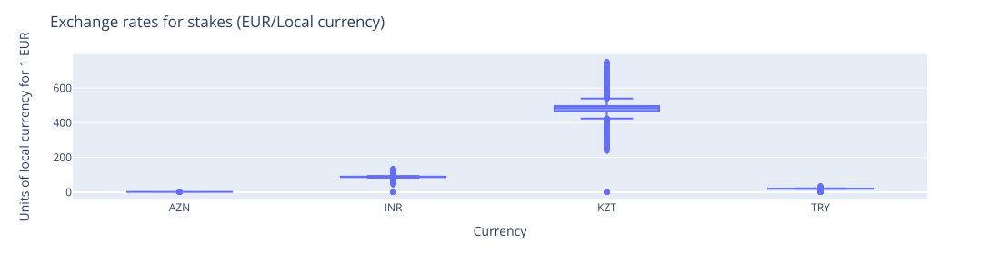

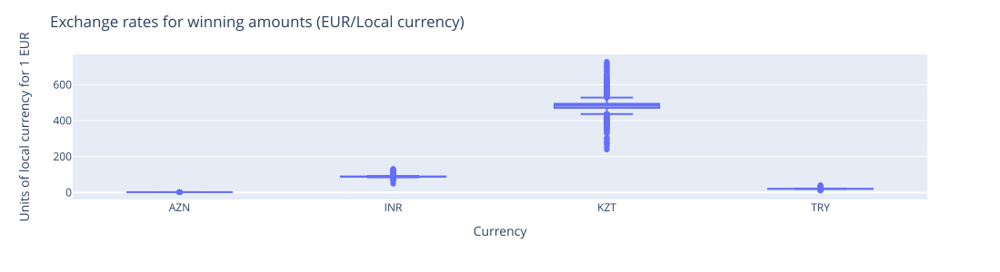

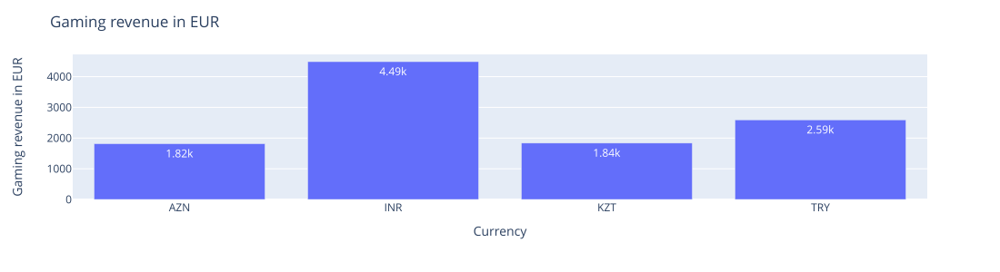

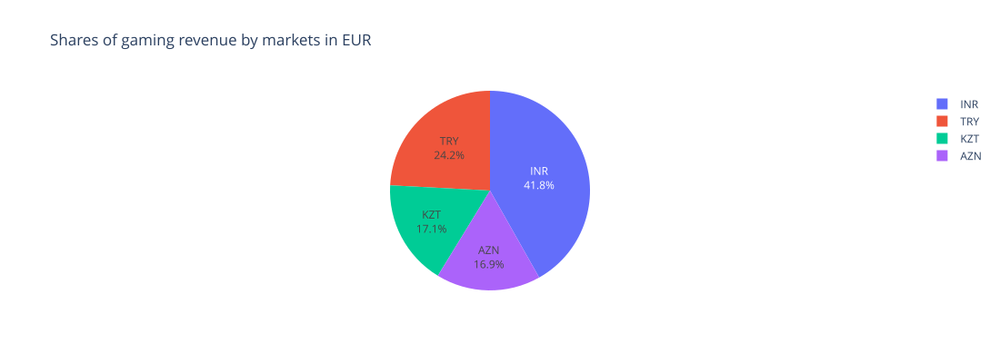

In [14]:
# Preparing visuals:
stakes = px.box(data.sort_values('Currency'),
                y = 'stake_exchange_rate',
                x = 'Currency',
                labels={"stake_exchange_rate": "Units of local currency for 1 EUR"},
               )
stakes.update_layout(title_text="Exchange rates for stakes (EUR/Local currency)",
                     autosize=True,
                    )

won = px.box(data[data['won_exchange_rate'] != 0].sort_values('Currency'),
             y = 'won_exchange_rate',
             x = 'Currency',
             labels={"won_exchange_rate": "Units of local currency for 1 EUR"},
            )
won.update_layout(title_text="Exchange rates for winning amounts (EUR/Local currency)",
                  autosize=True,
                 )

gr_eur = px.bar(data.groupby("Currency", as_index = False)\
                    .agg({"result_eur": "sum"}).sort_values('Currency'),
                x="Currency",
                y="result_eur",
                text="result_eur",
                text_auto='.3s',
                labels={"result_eur": "Gaming revenue in EUR"},
               )
gr_eur.update_layout(title_text="Gaming revenue in EUR",
                     autosize=True,
                    )

pie = go.Figure(data=[go.Pie(labels=data['Currency'],
                             values=data['result_eur'],
                             textinfo='label+percent')]
               )
pie.update_layout(title_text="Shares of gaming revenue by markets in EUR",
                  autosize=True,
                 )

display(SVG(pio.to_image(stakes, format="svg",engine='orca', width=1100, height=300)),
        SVG(pio.to_image(won, format="svg",engine='orca', width=1100, height=300)),
        SVG(pio.to_image(gr_eur, format="svg",engine='orca', width=1100, height=300)),
        SVG(pio.to_image(pie, format="svg",engine='orca', width=1100, height=400)),
       )

From graphs above we may see:
1. The exchange rate of EUR/KZT is the most volatile - may be we need to perform an audit of exchanging vendor / change forex platform for this pair of currencies, because, as I've seen 500 KZT for 1 EUR and 450 KZT for 1 EUR are accordingly the highest and the lowest exchange rate for current year. 
2. In terms of gaming revenue brought to Xxxxxxxx the hugest market is located in INR region / India. Turkey is situated at the 2nd place and the 3rd place in share of gaming revenue is shared by Kazakhstan and Azerbaijan.

We may also guess that if the issue with KZT currency volatility is resolved a share or revenue in EUR brought from KZT market may grow.

Let's also check if players' localization between currency/region and platform works well:

In [15]:
# Grouping data by UserId to count unique names of currencies and platforms: 
data.groupby('UserId', as_index = False)\
    .agg({'Currency': 'nunique',
          'PlatformId': 'nunique'})\
    .sort_values(['Currency', 'PlatformId'],
                 ascending = [False, False])\
    .head(10)

,UserId,Currency,PlatformId
0,001uolondk,1,1
1,004qrks4d4,1,1
2,0058phqrdb,1,1
3,006t53b1l8,1,1
4,007g2ggxh6,1,1
5,00ck6pj7lb,1,1
6,00cqc27iku,1,1
7,00dp7sarkr,1,1
8,00erlqa7p9,1,1
9,00qjh4t3r6,1,1


From here we may see that there's only one combination of Platform and Currency for every UserId. Now let's check if there's only relationship between planform and currency / region:

In [16]:
# Grouping platforms by currencies/regions and number and share of unique players: 
platfor_gb = data.groupby(['PlatformId', 'Currency'],
                          as_index = False)\
                    .agg({'UserId': 'nunique'})
platfor_gb['% of users'] = (platfor_gb['UserId'] * 100.0 / platfor_gb['UserId'].sum()).map("{0:.2f}%".format)
platfor_gb

,PlatformId,Currency,UserId,% of users
0,1,KZT,11150,47.58%
1,2,AZN,579,2.47%
2,2,INR,1468,6.26%
3,2,KZT,3148,13.43%
4,2,TRY,737,3.14%
5,3,AZN,1153,4.92%
6,3,INR,1642,7.01%
7,3,KZT,571,2.44%
8,3,TRY,524,2.24%
9,4,INR,21,0.09%


Form this table we may see that:
- Platform 1 works only for players from Kazakhstan with almost 50% share of all active players during the period of observation
- Platforms 2 and 3 work for all markets/regions with a little less than 42% of all active players during the period of observation
- Platform 4 serves players only form India and Turkey

Together with previous findings on uniqueness of relations between UserId and Platform and UserId and Currency, this separation of unique players between platforms looks like it is about server capacity allocation. Let's briefly examine monetary performance of these platforms:

In [17]:
# Grouping platforms by their gaming revenue in eur: 
platform_gb_result = data.groupby(['PlatformId'],
                                  as_index = False)\
                         .agg({'result_eur': 'sum'})
platform_gb_result

,PlatformId,result_eur
0,1,-1191.46
1,2,8373.80
2,3,3737.10
3,4,-185.24


And that actually seems interesting: within the period of observation we may see that platforms 1 and 4 are being unprofitable. Guess we'll dive into it deeper in the next section.

**To conclude the following section, let's put our findings and assumption onto a list:**
1. We've preprocessed (checked consistency) and got familiar with the dataset at our service.
2. We've found out overall approach to converting stakes and winning amounts to euro and that the game is played in player's local currency
3. We've verified game's overall positive financial result in local and domestic (EUR) currencies
4. We've found out that players have hard binding with platforms and currencies/regions, however, platforms may serve more than one region.
5. We've highlighted volatility in EUR/KZT pair's exchange rate
6. We've revealed fault enties of zero amount staking and dropped 2 most obvious of them  
7. We've indicated errors in 13 games related to AZN region/currency exchange rate - that's the only error that I could find
8. We've valuated the distribution of shares of gaming revenue brought to Xxxxxxxx by markets/regions

[Back to Table of Contents](#toc)<br><br>

<a class="anchor" id="second-bullet"></a>
## Report on game's overall performance

In this section we'll be observing the overall game's performance from the standpoint of Xxxxxxxx / head company.

Let's calculate **gaming revenue**, **cumulative gaming revenue**, **ARPPU** and **Return to player (RTP)** (the last three are extremely similar) daily grouped by platform and observe the visuals:

In [18]:
# Performing calculations: 
gr_gb_date = data.groupby(['CreatedAtDate'], as_index = False)\
                    .agg({'stake_eur':'sum',
                          'won_eur': 'sum',
                          'result_eur': 'sum',
                          'UserId': 'nunique'},
                        )
gr_gb_date['RTP'] = (gr_gb_date['won_eur'] / gr_gb_date['stake_eur'])
gr_gb_date['ARPPU'] = (gr_gb_date['result_eur'] / gr_gb_date['UserId'])
gr_gb_date['cummultive_result'] = gr_gb_date['result_eur'].cumsum()

gr_gb_date_platform = data.groupby(['PlatformId', 'CreatedAtDate'], as_index = False)\
                            .agg({'stake_eur':'sum',
                                  'won_eur': 'sum',
                                  'result_eur': 'sum',
                                  'UserId': 'nunique'},
                                )
gr_gb_date_platform['RTP'] = (gr_gb_date_platform['won_eur'] / gr_gb_date_platform['stake_eur'])
gr_gb_date_platform['ARPPU'] = (gr_gb_date_platform['result_eur'] / gr_gb_date_platform['UserId'])

gr_gb_date_platform1 = gr_gb_date_platform[gr_gb_date_platform['PlatformId'] == 1]
gr_gb_date_platform1.loc[:,['cummultive_result']] = gr_gb_date_platform1['result_eur'].cumsum()
gr_gb_date_platform2 = gr_gb_date_platform[gr_gb_date_platform['PlatformId'] == 2]
gr_gb_date_platform2.loc[:,['cummultive_result']] = gr_gb_date_platform2['result_eur'].cumsum()
gr_gb_date_platform3 = gr_gb_date_platform[gr_gb_date_platform['PlatformId'] == 3]
gr_gb_date_platform3.loc[:,['cummultive_result']] = gr_gb_date_platform3['result_eur'].cumsum()
gr_gb_date_platform4 = gr_gb_date_platform[gr_gb_date_platform['PlatformId'] == 4]
gr_gb_date_platform4.loc[:,['cummultive_result']] = gr_gb_date_platform4['result_eur'].cumsum()

gr_gb_date_platform_all = pd.concat([gr_gb_date_platform1,
                                     gr_gb_date_platform2,
                                     gr_gb_date_platform3,
                                     gr_gb_date_platform4]
                                   )

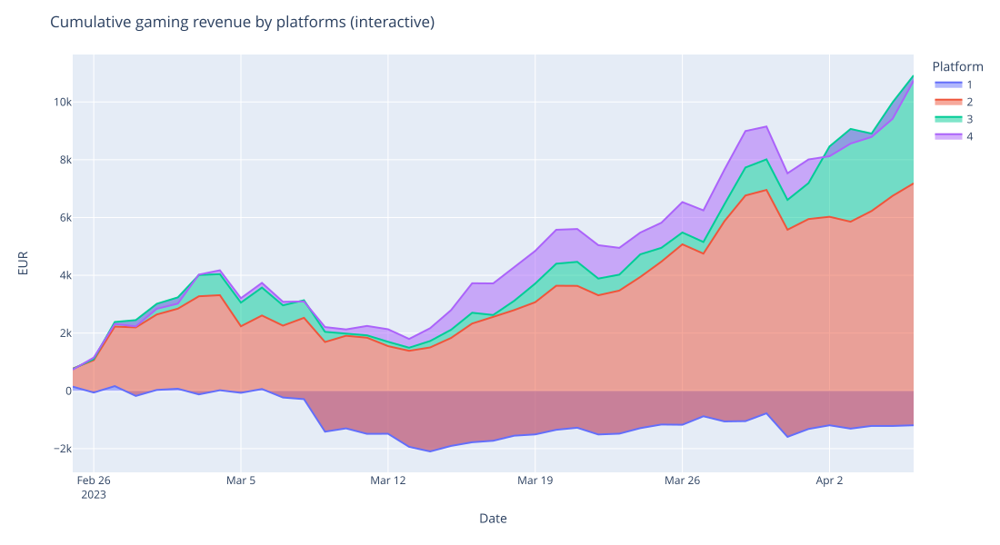

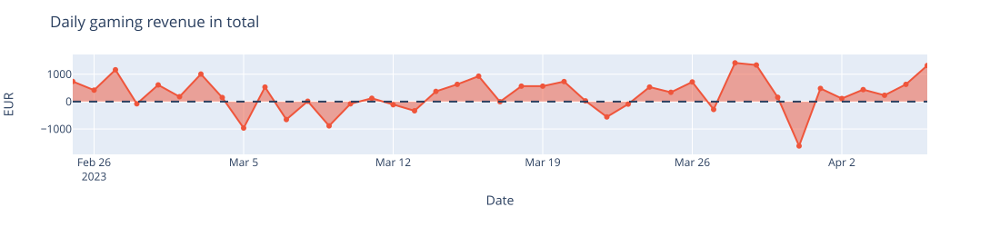

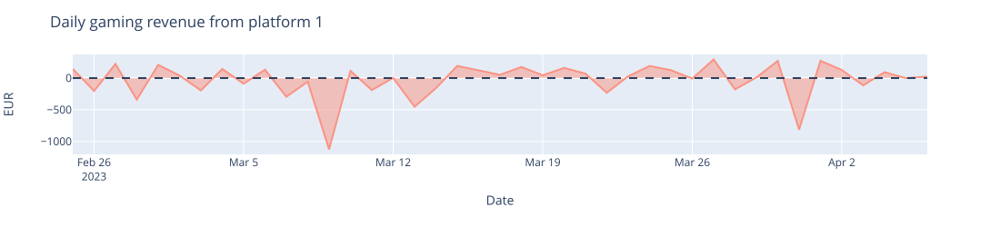

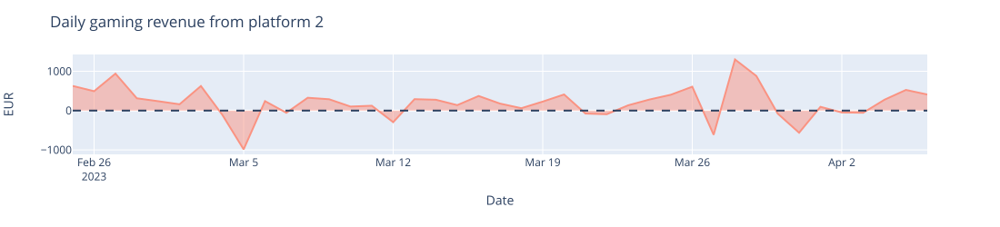

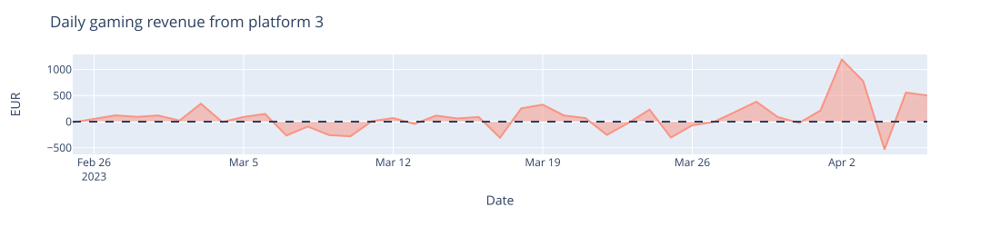

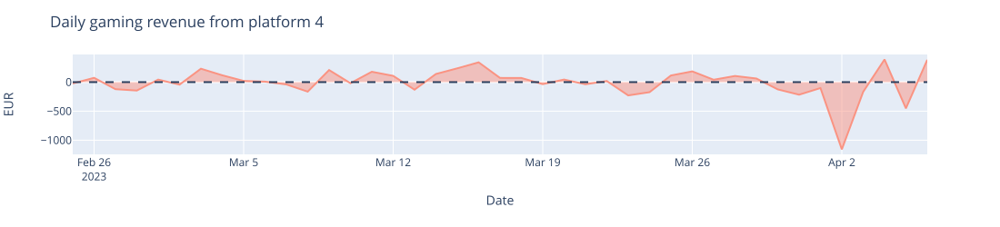

In [19]:
# Preparing visuals:
cumm_gr = px.area(gr_gb_date_platform_all,
                  x = "CreatedAtDate",
                  y = "cummultive_result",
                  color = 'PlatformId',
                  labels = {
                      "cummultive_result": "EUR",
                      "CreatedAtDate" :"Date",
                      "PlatformId": "Platform"
                  })
cumm_gr.update_layout(title_text="Cumulative gaming revenue by platforms (interactive)",
                      autosize=True,
                     )

daily_gr = px.area(gr_gb_date,
                   x = "CreatedAtDate",
                   y = "result_eur",
                   markers = True,
                   labels = {
                       "result_eur": "EUR",
                       "CreatedAtDate" :"Date"
                   })
daily_gr.add_hline(y=0, line_dash="dash")
daily_gr.update_traces(line_color='#EF553B')
daily_gr.update_layout(title_text="Daily gaming revenue in total",
                       autosize=True,
                      )

display(SVG(pio.to_image(cumm_gr, format="svg",engine='orca', width=1100, height=600)),
        SVG(pio.to_image(daily_gr, format="svg",engine='orca', width=1100, height=250)),
       )

for platform in gr_gb_date_platform_all['PlatformId'].unique():
    daily_gr_pl = px.area(gr_gb_date_platform_all[gr_gb_date_platform_all['PlatformId'] == platform],
                          x="CreatedAtDate",
                          y="result_eur",
                          labels={
                              "result_eur": "EUR",
                              "CreatedAtDate" :"Date"
                          })
    daily_gr_pl.add_hline(y=0, line_dash="dash")
    daily_gr_pl.update_traces(line_color='#fa9382')
    daily_gr_pl.update_layout(title_text="Daily gaming revenue from platform {0}".format(platform),
                              autosize=True,
                             )
    
    display(SVG(pio.to_image(daily_gr_pl, format="svg",engine='orca', width=1100, height=250)))

From charts above we may see that cumulative gaming revenue is positive and exceeds 10k EUR in the end of the period, however, if we will sequentially turn off platforms by clicking on legend until only one remains we will see the negative financial effect on the revenue of platforms 1 and 4.
Moreover, targeted Daily gaming revenue charts reaffirm this observation: we need to pay extra attention to platforms' 1 and 4 impact on revenue.
We may see significant loss of revenue on the 2nd of August on platform 4 that was smoothed on total by a huge revenue rise of revenue on platform 3 the same day. That's an interesting coincidence. We may also see dramatic spurs of losses on the 9th and 31st of March on platform 1. 

Let's observe ARPPUs in the same "total" & "sliced by platform" way:

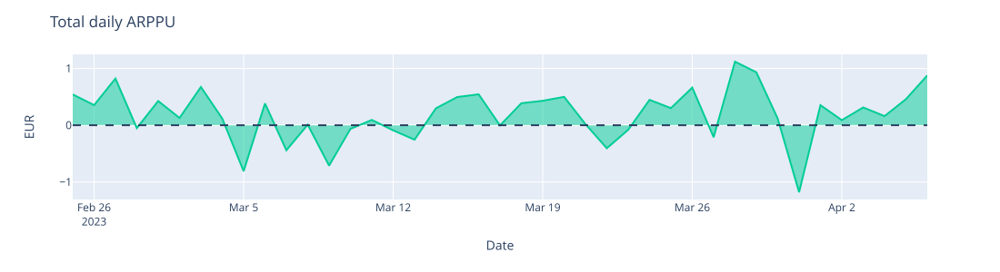

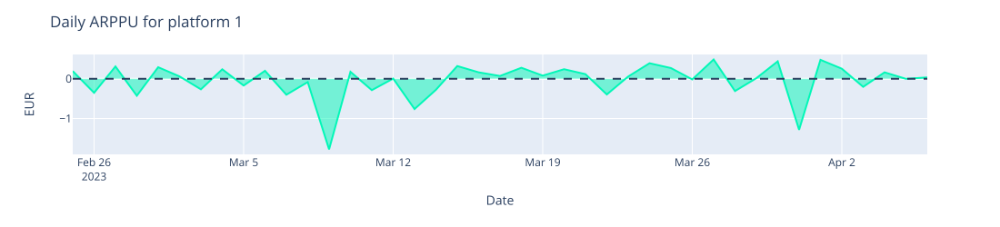

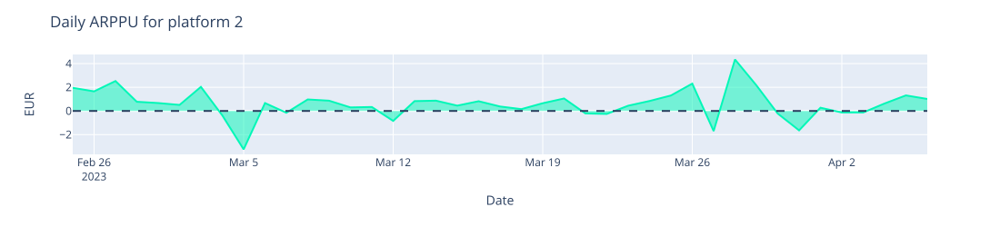

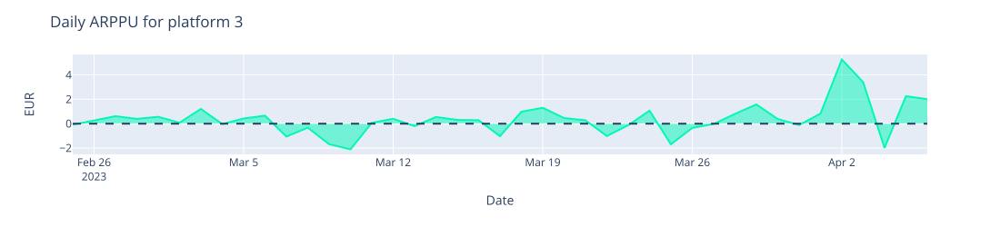

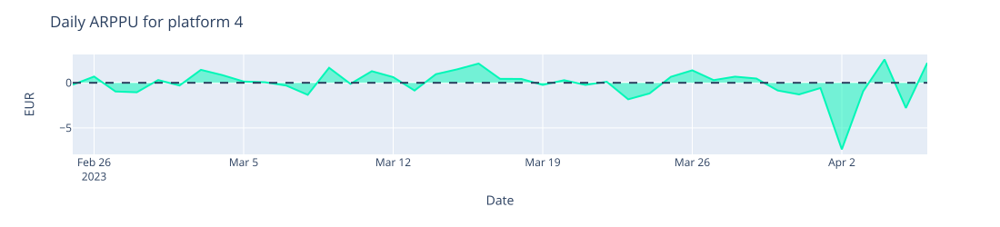

In [20]:
# Preparing visuals: 
daily_arppu = px.area(gr_gb_date,
                      x="CreatedAtDate",
                      y="ARPPU",
                      labels={
                          "ARPPU": "EUR",
                          "CreatedAtDate" :"Date"
                      })

daily_arppu.add_hline(y=0, line_dash="dash")
daily_arppu.update_traces(line_color='#00CC96')
daily_arppu.update_layout(title_text="Total daily ARPPU",
                          autosize=True,
                         )

display(SVG(pio.to_image(daily_arppu, format="svg",engine='orca', width=1100, height=300)))

for platform in gr_gb_date_platform_all['PlatformId'].unique():
    daily_gr_pl = px.area(gr_gb_date_platform_all[gr_gb_date_platform_all['PlatformId'] == platform],
                          x="CreatedAtDate",
                          y="ARPPU",
                          labels={
                              "ARPPU": "EUR",
                              "CreatedAtDate" :"Date"
                          })
    daily_gr_pl.add_hline(y=0, line_dash="dash")
    daily_gr_pl.update_traces(line_color='#02f7b7')
    daily_gr_pl.update_layout(title_text="Daily ARPPU for platform {0}".format(platform),
                              autosize=True,
                             )
    
    display(SVG(pio.to_image(daily_gr_pl, format="svg", engine='orca', width=1100, height=250)))

We may see that ARPPU graphs have similar behavior with the daily revenue. Let's also observe the RTP visuals as the last step of this section (I've heard that in some jurisdictions this rate is regulated by law):

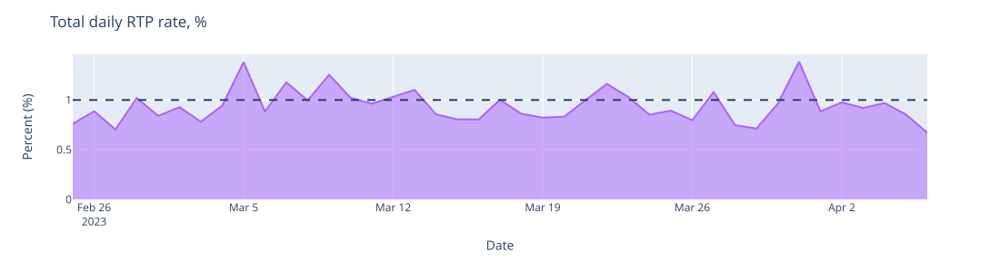

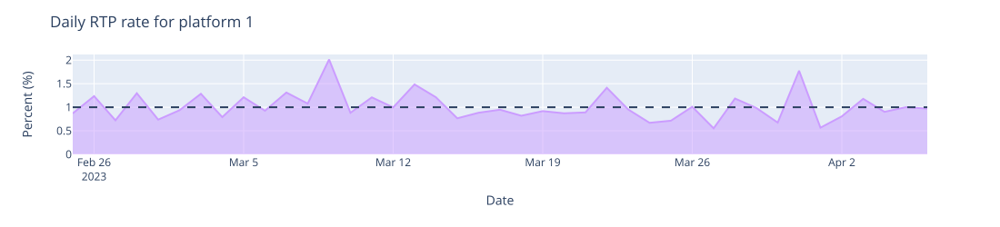

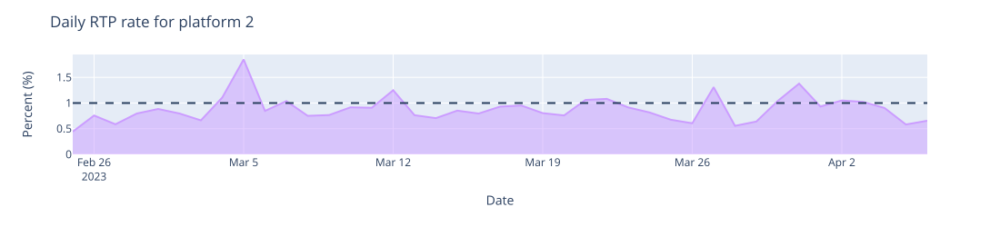

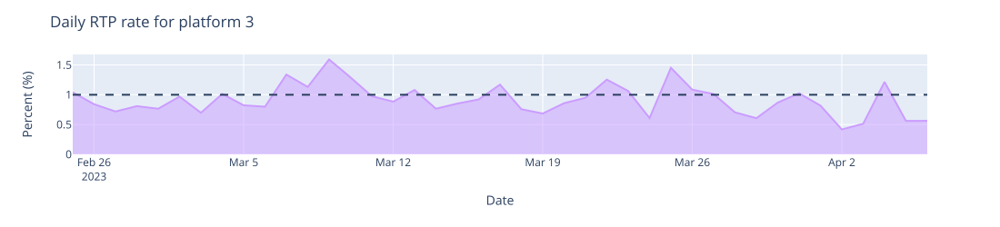

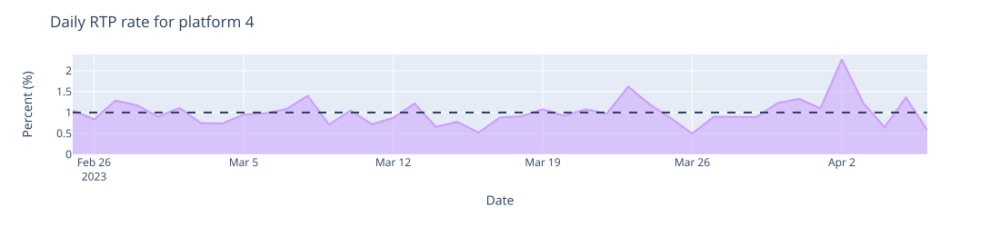

In [21]:
# Preparing visuals: 
daily_rtp = px.area(gr_gb_date,
                    x="CreatedAtDate",
                    y="RTP",
                    labels={
                        "RTP": "Percent (%)",
                        "CreatedAtDate" :"Date"
                    })
daily_rtp.add_hline(y=1, line_dash="dash")
daily_rtp.update_traces(line_color='#AB63FA')
daily_rtp.update_layout(title_text="Total daily RTP rate, %",
                        autosize=True,
                       )

display(SVG(pio.to_image(daily_rtp, format="svg",engine='orca', width=1100, height=300)))

for platform in gr_gb_date_platform_all['PlatformId'].unique():
    daily_rtp_pl = px.area(gr_gb_date_platform_all[gr_gb_date_platform_all['PlatformId'] == platform],
                           x = "CreatedAtDate",
                           y = "RTP",
                           labels={
                               "RTP": "Percent (%)",
                               "CreatedAtDate" :"Date"
                           })
    daily_rtp_pl.add_hline(y=1, line_dash="dash")
    daily_rtp_pl.update_traces(line_color='#cb9cff')
    daily_rtp_pl.update_layout(title_text="Daily RTP rate for platform {0}".format(platform),
                               autosize=True,
                              )
    
    display(SVG(pio.to_image(daily_rtp_pl, format="svg",engine='orca', width=1100, height=250)))

To be honest, all of the three last indicators are a variation of one - the only difference is the angle of view. As for the last one, now it is presented in a form more suitable for players, however from the standpoint of Xxxxxxxx it is easier to perceive an inverse rate: (1 - RTP)%

In the conclusion to this section, we are going to admit:
1. In the period of observation in total Xxxxxxxx have brought a positive financial result to its owners.
2. There are 2 platforms inside Xxxxxxxx, that have localized negative impact on overall financial statement in the period of observation: these are the platfroms 1 and 4.
3. There's a need of further examination of shocks, occurred on the 5th of March related to platform 2, on the 9th and 31st of March on platform 1 and on the 2nd of April on platforms 3, that caused negative financial effect (losses).

[Back to Table of Contents](#toc)<br><br>

<a class="anchor" id="third-bullet"></a>
## Players' engagement metrics

In this section we will try to approach the assessment of player engagement. We have to admit that in our case we have no proper data to perform cohort analysis, because we don't have proper profile-related metrics like date of account creation, player's sessionId and so on, but we will try to perform some engagement-related metrics calculation and visualization.

In [22]:
# Building profiles
profiles = data.groupby('UserId', as_index = False)\
                .agg(First = ('CreatedAt', 'first'),
                     Last = ('CreatedAt', 'last'),
                     FirstDt = ('CreatedAtDate', 'first'),
                     LastDt = ('CreatedAtDate', 'last'),
                    )
profiles['Delta'] = (profiles['Last'] - profiles['First']).dt.days

profiles_d = data.groupby(['UserId', 'CreatedAtDate'], as_index = False)\
                    .agg(First = ('CreatedAt', 'first'),
                         Last = ('CreatedAt', 'last'),
                         Stakes = ('MatchId', 'nunique'),
                        )
profiles_d['Delta'] = (profiles_d['Last'] - profiles_d['First']) / pd.Timedelta(hours=1)

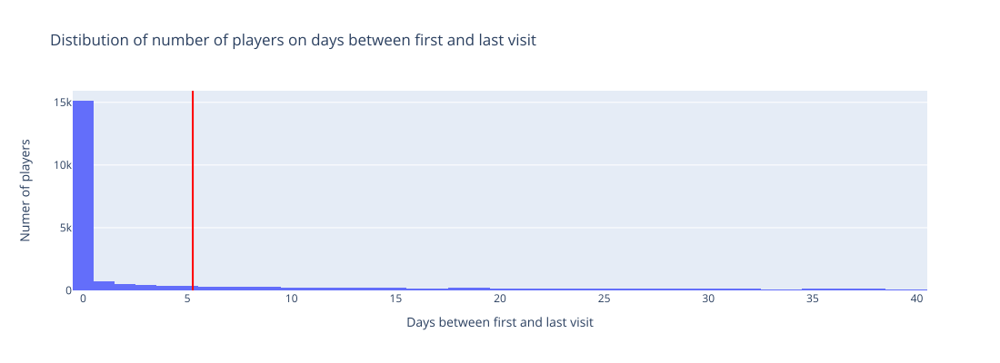

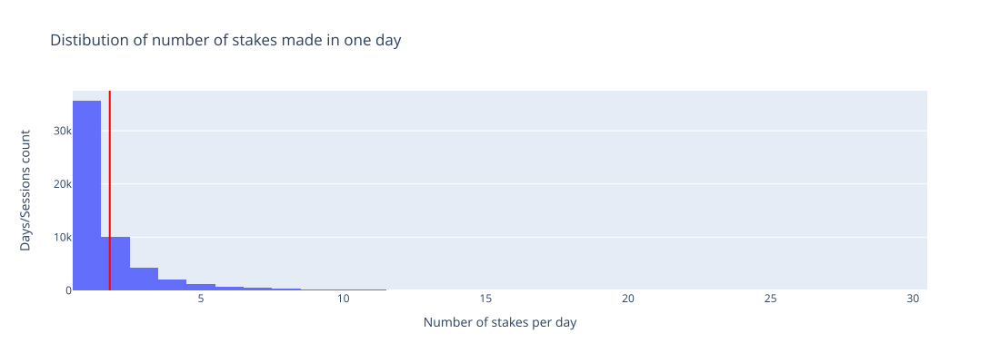

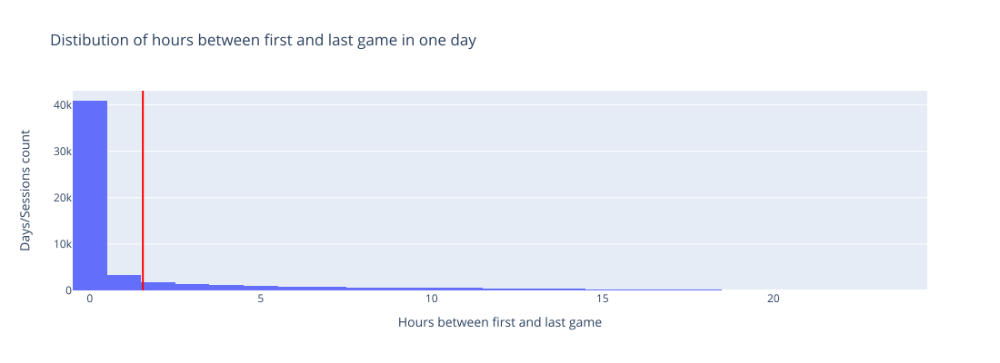

In [23]:
# Preparing distribution histogram
distr_days = px.histogram(profiles,
                          x ='Delta',
                          title = 'Distibution of number of players on days between first and last visit',
                          nbins = 41,
                         )
distr_days.update_xaxes(title_text = 'Days between first and last visit')
distr_days.update_yaxes(title_text = 'Numer of players')
distr_days.add_vline(x = profiles['Delta'].mean(),
                     line_color = "red",
                    )

distr_st = px.histogram(profiles_d,
                        x = 'Stakes',
                        title = 'Distibution of number of stakes made in one day',
                        nbins = 31,
                       )
distr_st.update_xaxes(title_text = 'Number of stakes per day')
distr_st.update_yaxes(title_text = 'Days/Sessions count')
distr_st.add_vline(x = profiles_d['Stakes'].mean(),
                   line_color = "red",
                  )

distr_hr = px.histogram(profiles_d,
                        x = 'Delta',
                        title = 'Distibution of hours between first and last game in one day',
                        nbins = 24,
                       )
distr_hr.update_xaxes(title_text = 'Hours between first and last game')
distr_hr.update_yaxes(title_text = 'Days/Sessions count')
distr_hr.add_vline(x = profiles_d['Delta'].mean(),
                   line_color="red",
                  )

display(SVG(pio.to_image(distr_days, format="svg",engine='orca', width=1100, height=400)),
        SVG(pio.to_image(distr_st, format="svg",engine='orca', width=1100, height=400)),
        SVG(pio.to_image(distr_hr, format="svg",engine='orca', width=1100, height=400)),
       )

From charts above we may see that around 14k players have played Xxxxxxxx only once and never got back in the observing period, however, on average players keep Xxxxxxxx in mind for 6 days (days between first and last visit in the observing period), however we are not sure, if a player comes back in these days or not. Moreover, we may see that the average number of stake per day is 2 and average session is around 1.5 hours.

Let's try to perform cohort analysis, even though it is not 100% correct to do so without having the first visit date in our dataset, but let's assume that the first timestamp we find for a particular player will be player's first visit/activity date. Here is a bar chart with the number of new players by dates of observation:

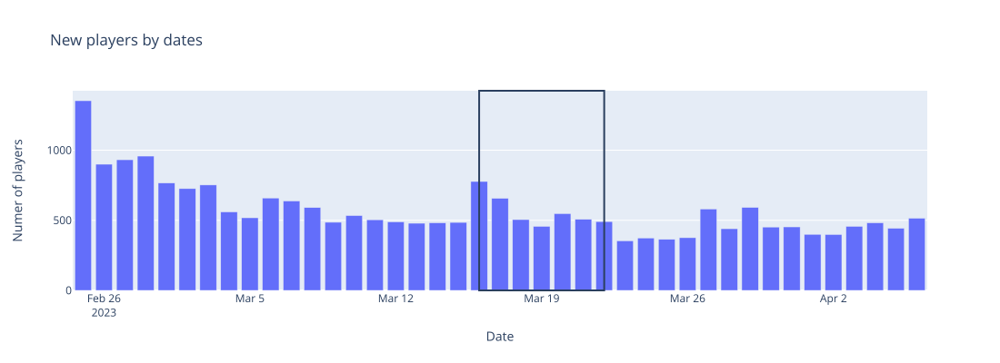

In [24]:
# Preparing visual
distr_days = px.bar(profiles.groupby('FirstDt', as_index = False)\
                            .agg({'UserId':'nunique'}),
                    x = 'FirstDt',
                    y ='UserId',
                    title = 'New players by dates',
                   )
distr_days.update_xaxes(title_text = 'Date')
distr_days.update_yaxes(title_text = 'Numer of players')
distr_days.add_vrect(x0 = '2023-03-16',
                     x1 = '2023-03-22',
                    )

display(SVG(pio.to_image(distr_days, format = "svg", engine = 'orca', width = 1100, height = 400)))

To simplify and make it look clearer, let's limit our cohort study with one week from 16th to the 22nd of March and set lifetime of observation on same 7 days. In these frames let's observe the **Retention Rate** and **LTV** of players: 

In [25]:
# Calculating Retention Rate
profiles_cut = profiles[(profiles['FirstDt'] >= '2023-03-16')
                         & (profiles['FirstDt'] <= '2023-03-22')]

results_raw = profiles_cut[['UserId', 'First', 'FirstDt']]\
                .merge(data[['CreatedAt', 'UserId']],
                       on = 'UserId',
                       how = 'left',
                      )
results_raw.columns = ['UserId',
                       'First',
                       'FirstDt',
                       'Session']
results_raw['lifetime'] = (results_raw['Session'] - results_raw['First']).dt.days
results_raw = results_raw[results_raw['lifetime'] <= 6]

results_grouped = results_raw.pivot_table(index = ['FirstDt'],
                                          columns = 'lifetime',
                                          values = 'UserId',
                                          aggfunc = 'nunique',
                                         )

cohort_size = results_raw.groupby('FirstDt', as_index = False)\
                            .agg({'UserId':'nunique'})
cohort_size.columns = ['FirstDt', 'CohortSize']

results_grouped = cohort_size.merge(results_grouped,
                                    on = 'FirstDt',
                                    how = 'left')\
                             .set_index('FirstDt')\
                             .fillna(0)

RetentionRate = results_grouped.div(results_grouped['CohortSize'],
                                    axis = 0)\
                               .drop(columns = ['CohortSize'])

# Displaying the table
rr_show = RetentionRate.map("{0:.2%}".format).style\
                        .set_table_styles(caption)\
                        .set_table_attributes("style='display:inline'")\
                        .set_caption("Retention rate of cohorts by their lifetime")

display_html(rr_show._repr_html_(), raw = True)

,0,1,2,3,4,5,6
FirstDt,,,,,,,
2023-03-16 00:00:00,100.00%,10.94%,7.85%,6.69%,6.05%,6.05%,6.18%
2023-03-17 00:00:00,100.00%,11.57%,8.98%,8.22%,6.09%,5.33%,5.18%
2023-03-18 00:00:00,100.00%,9.90%,6.73%,5.74%,5.35%,3.56%,2.57%
2023-03-19 00:00:00,100.00%,7.22%,4.81%,6.56%,5.25%,3.06%,2.63%
2023-03-20 00:00:00,100.00%,10.77%,6.75%,4.56%,3.83%,4.56%,4.38%
2023-03-21 00:00:00,100.00%,12.23%,7.69%,5.33%,5.72%,5.92%,5.13%
2023-03-22 00:00:00,100.00%,11.20%,9.57%,7.33%,6.72%,4.89%,4.28%


Above we may see a table with the Retention Rate, where every row is the name/date of a cohort and columns are their lifetime. We may see a significant drop between day 0 (the first day of visit) and day 1 of players' lifetime. Let's visualize this data, excluding day 0 for clearer view:

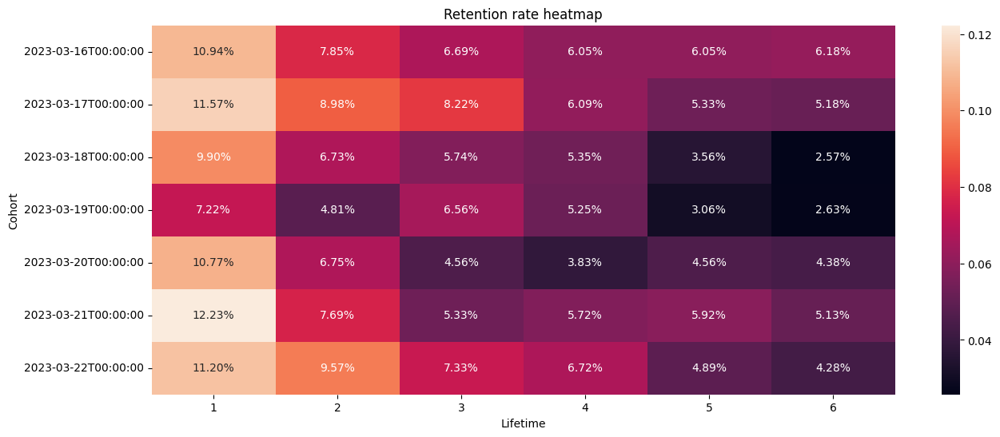

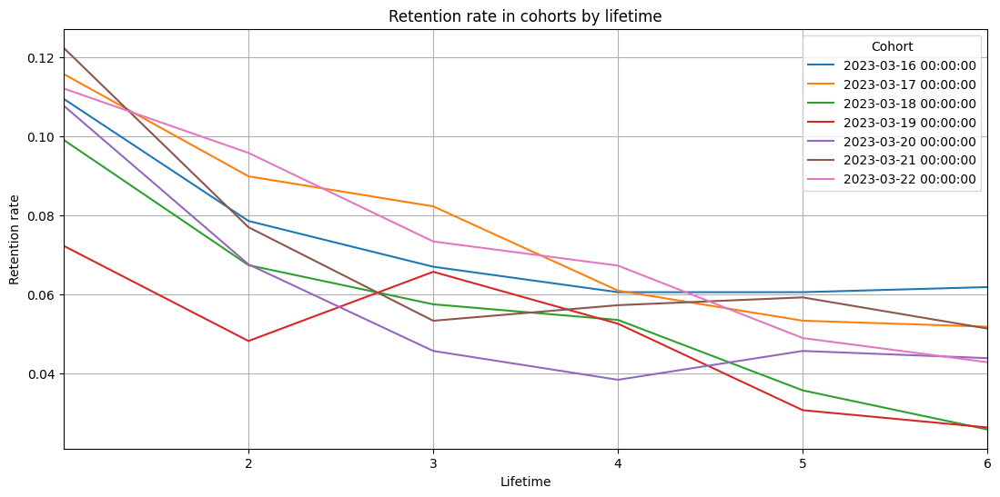

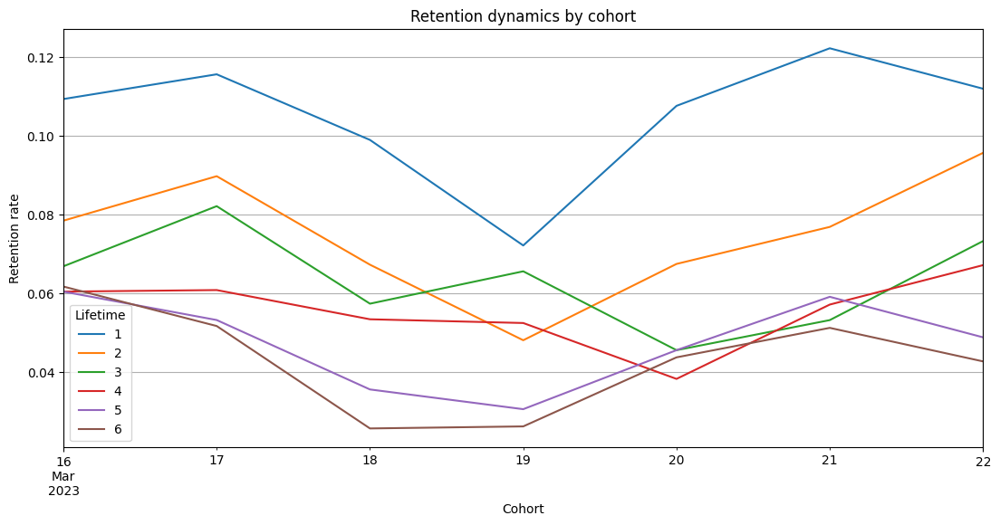

In [26]:
# Preparing visuals: heatmap and line plots:
plt.figure(figsize = (15, 6))
sns.heatmap(RetentionRate.drop(columns = [0]),
            annot = True,
            fmt = '.2%',
           )
plt.title('Retention rate heatmap')
plt.xlabel('Lifetime')
plt.ylabel('Cohort')
plt.show()

ax = RetentionRate.drop(columns = [0]).T.plot(grid = True,
                                              xticks = list(RetentionRate.drop(columns = [0]).columns.values),
                                              figsize = (13.1,6),
                                              xlim = (0, 5),
                                             )
ax.get_legend().set_title("Cohort")
plt.title('Retention rate in cohorts by lifetime')
plt.xlabel('Lifetime')
plt.ylabel('Retention rate')
plt.show()

ax = RetentionRate.drop(columns = [0])\
                    .plot(grid = True,
                          figsize = (13.1,6),
                         )
plt.title('Retention dynamics by cohort')
plt.xlabel('Cohort')
plt.ylabel('Retention rate')
ax.get_legend().set_title("Lifetime")
plt.show()

From charts above we may see that some cohorts perform better, for example: 2023-03-17, 2023-03-16, - some perform worse: 2023-03-18, 2023-03-19. The key business task here is to identify marketing channels that bring us players with profiles similar to those who formed the best participating cohorts with the highest retention rate. On a heatmap we are looking for the brightest row, on the second chart we are trying to identify the highest and the most stable line above others, on the latter chart we sequentially go from the highest curve to the lowest to find local maximums.

Now let's get to players **Lifetime Value**:

In [28]:
# Calculating LTV:
results_raw = profiles_cut[['UserId', 'First', 'FirstDt']]\
                        .merge(data.groupby(['UserId', 'CreatedAtDate'], as_index = False)\
                                   .agg({'result_eur': 'sum'}),
                               on = 'UserId',
                               how = 'left',
                               )
results_raw.columns = ['UserId',
                       'First',
                       'FirstDt',
                       'Session',
                       'Result']

results_raw['lifetime'] = (results_raw['Session'] - results_raw['FirstDt']).dt.days
results_raw = results_raw[results_raw['lifetime'] <= 6]

results_grouped = results_raw.pivot_table(index = ['FirstDt'],
                                          columns = 'lifetime',
                                          values = 'Result',
                                          aggfunc = 'sum',
                                         )

cohort_size = results_raw.groupby('FirstDt',
                                  as_index = False)\
                         .agg({'UserId':'nunique'})
cohort_size.columns = ['FirstDt',
                       'CohortSize']

results_grouped = cohort_size.merge(results_grouped,
                                    on = 'FirstDt',
                                    how = 'left')\
                             .set_index('FirstDt')\
                             .fillna(0)

LTV = results_grouped.div(results_grouped['CohortSize'],
                          axis = 0)\
                     .drop(columns = ['CohortSize'])
LTV.loc['All cohorts'] = LTV.sum(numeric_only = True,
                                 axis=0,
                                )

# Displaying the table
ltv_show = LTV.style\
                .set_table_styles(caption)\
                .set_table_attributes("style='display:inline'")\
                .set_caption("LTV of cohorts by their lifetime")

display_html(ltv_show._repr_html_(), raw = True)

,0,1,2,3,4,5,6
FirstDt,,,,,,,
2023-03-16 00:00:00,0.467066,0.776049,0.077246,0.058533,0.223900,0.091596,-0.402136
2023-03-17 00:00:00,0.162953,0.012131,0.146210,0.088798,0.102694,-0.052024,0.001918
2023-03-18 00:00:00,0.105842,0.156574,-0.064832,-0.073644,-0.029327,0.102455,-0.016198
2023-03-19 00:00:00,0.197965,0.114945,0.010766,0.043282,0.036302,0.027877,0.003239
2023-03-20 00:00:00,-0.122245,0.043339,-0.097062,-0.064416,-0.073650,0.024179,0.085310
2023-03-21 00:00:00,0.066785,0.116529,0.008245,0.072150,0.094773,0.049625,0.001736
2023-03-22 00:00:00,0.116578,0.058310,-0.003829,0.031303,0.052546,0.047800,0.030978
All cohorts,0.994944,1.277877,0.076744,0.156006,0.407238,0.291509,-0.295155


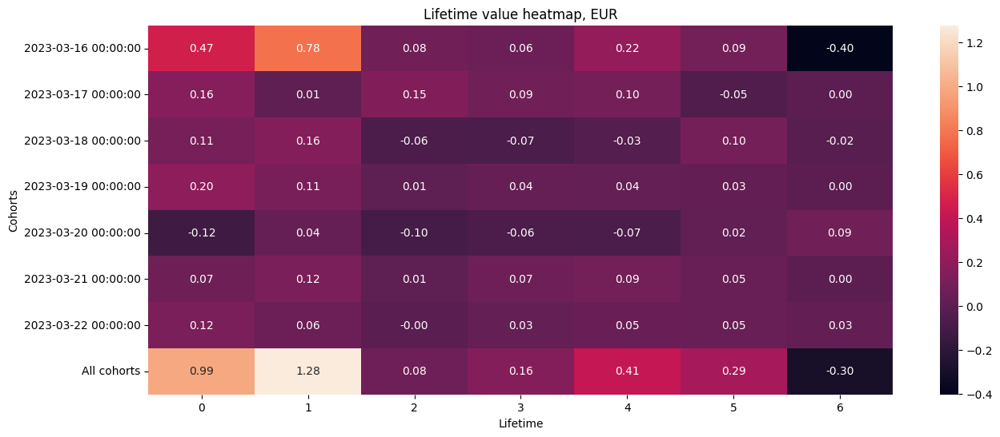

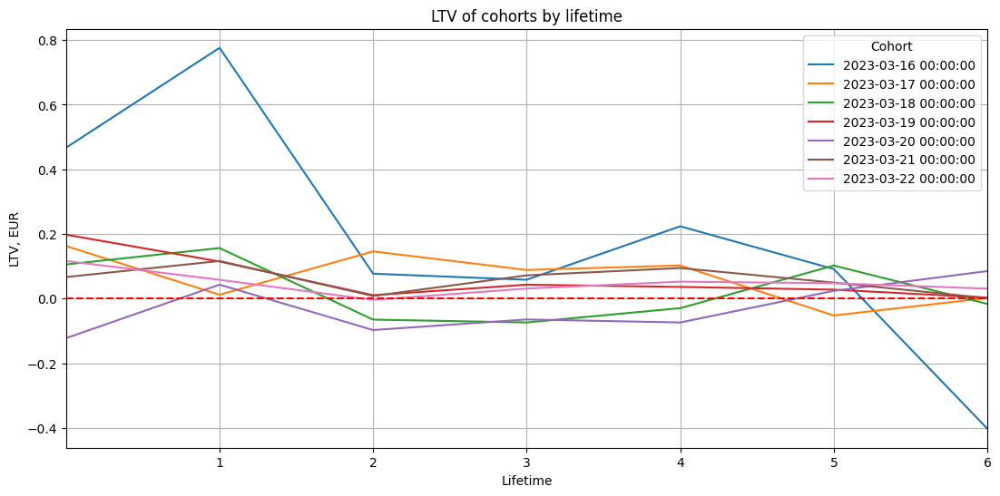

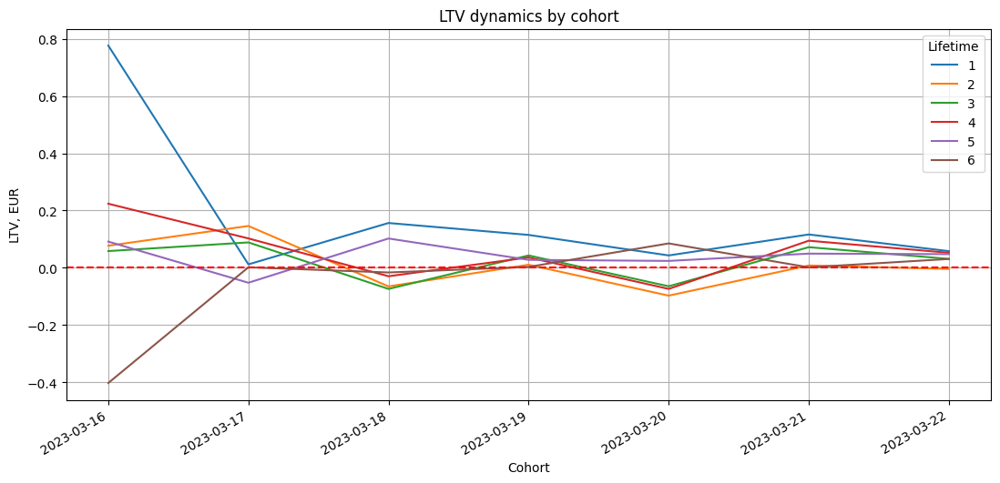

In [29]:
# Preparig visuals:
plt.figure(figsize=(15, 6))
sns.heatmap(LTV,
            annot = True,
            fmt = '.2f',
           )
plt.title('Lifetime value heatmap, EUR')
plt.xlabel('Lifetime')
plt.ylabel('Cohorts')
plt.show()


ax = LTV[LTV.index != 'All cohorts']\
        .T.plot(grid = True,
                xticks = list(RetentionRate.drop(columns = [0]).columns.values),
                figsize = (13.1,6),
                xlim = (0, 6),
               )
ax.get_legend().set_title("Cohort")
plt.title('LTV of cohorts by lifetime')
plt.xlabel('Lifetime')
plt.ylabel('LTV, EUR')
plt.axhline(y = 0,
            color = 'red',
            linestyle = "--",
           )
plt.show()

ax = LTV[LTV.index != 'All cohorts']\
        .drop(columns = [0])\
        .plot(grid = True,
              figsize = (13.1,6),
             )
ax.get_legend().set_title("Lifetime")
plt.title('LTV dynamics by cohort')
plt.xlabel('Cohort')
plt.ylabel('LTV, EUR')
plt.axhline(y = 0,
            color = 'red',
            linestyle = "--",
           )
plt.show()

From the charts above we may see the Lifetime Value of our clients from chosen cohorts. We may admit that cohort 2023-03-16 may be the most loyal to us: it was the highest value/revenue generator among others and had relatively high retention rate. We need to identify the channel of acquisition of these customers. As for the negative LTV of the 6th day, guess, it is not a matter of customer profiling, but a matter of probability of winning and may even strengthen the retention rate of these customers in further.

As a resume to this section, we've performed cohort analysis of Retention Rate and Lifetime value of customers that first came to Xxxxxxxx from 16th to the 22nd of March. We've identified the best performing cohort and suggested identifying its marketing channel of acquisition. However, we need to admit that the accuracy of the previous cohort analysis could be improved with actual first visit details, the agenda of advertising/marketing events, data on players browser, etc. 

[Back to Table of Contents](#toc)<br><br>

<a class="anchor" id="forth-bullet"></a>
## Proposition of additional variables

Continuing the previous thesis, we could perform more in-depth analysis if we would receive the following data:
- Player profiling/activity:
  -  Session Id
  -  Browser
  -  First visit date
  -  Channel of acquisition 
  -  Bonuses / Extra payouts
- Advertising / Marketing:
  -  Events Agenda
  -  Channels of players' acquisition
  -  Advertising budget
- Operational/Financial:
  - Maintenance costs per platform
  - Fixed costs

At least these fields could improve our financial metrics accuracy and correctness of cohort analysis. For example, we were counting overall gaming revenue, but with details on taxes and bonuses we could count Net Gaming Revenue. Moreover, we do not know how much we pay to acquire a client - this could be cured by receiving data of channels of acquisition per player and advertising expenses per player or per channel. Advertising / Marketing events agenda could improve our cohort and lifetime framing for better localization of the marketing/external effects we were studying. We have nothing to do with overall financial result per platform without knowing how much we pay for maintaining every platform (in case these are server capacity or separate teams to maintain application product).

...etc. - it is always not enough data:)

[Back to Table of Contents](#toc)<br><br>

<a class="anchor" id="fifth-bullet"></a>
## Resume

During this Case Task we have:
- preprocessed data and identified minor errors in data (13 games related to AZN region/currency),
- figured out overall approach to currency exchange
- verified Xxxxxxxx overall positive financial result
- calculated gaming revenue, ARPPU, RTP by platforms, localizing dates of extremums for further examination
- performed cohort analysis with valuation of Retention rate, LTV per cohorts formed from 16th to the 22nd of March on 7 days lifetime
- marked out better performing cohorts in terms of Retention rate and LTV
- highlighted volatility in EUR/KZT pair's exchange rate
- valuated the distribution of shares of gaming revenue brought to Xxxxxxxx by markets/regions and by platforms, identifying unprofitable ones (platform 1 and 4)
- proposed a board of additional fields/metrics to improve overall approach to analysis

[Back to Table of Contents](#toc)<br><br>